# Install Libraries


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics -q
!pip install pycocotools -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 886.3/886.3 kB 49.8 MB/s eta 0:00:00


In [ ]:
%cd /content/drive/MyDrive/turtles

/content/drive/MyDrive/turtles


In [ ]:
import os
import json
from pycocotools.coco import COCO
import shutil
from datetime import datetime
import cv2
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import random
from ultralytics import YOLO
from pathlib import Path

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# Data-Preprocessing
The Coco dataset is split into train, test and validation data using a time aware split based on open split column present in the metadata_splits.csv file.

The split dataset (in coco format) is converted into yolo directory structure that contains test, train and val directories, each with 'images' and 'labels' sub-directories with them.

The yolo labels for each image is created by converting each image annotation mask into polygons for each category.

In [ ]:
# Set Base Directory Path
base_dir = '/content/drive/MyDrive/turtles/turtles-data/'

# Directory where all images are stored
img_input_dir = os.path.join(base_dir, 'images')

# Create labels directory
label_dir = os.path.join(base_dir, '12_11/labels')
os.makedirs(label_dir, exist_ok=True)

# Path to coco annotations obtained from downloaded dataset
coco_path = os.path.join(base_dir, 'annotations.json')

with open(coco_path) as f:
    coco_data = json.load(f)
coco = COCO(coco_path)

loading annotations into memory...
Done (t=7.55s)
creating index...
index created!


In [ ]:
# Function to convert RLE to Polygon
def rle_to_polygon(rle, img_width, img_height):
    # Convert RLE to a binary mask
    mask = coco.annToMask(rle)

    # Find contours from the mask
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    polygons = []
    for contour in contours:
        # Flatten the contour and normalize the points
        contour_points = contour.flatten().tolist()
        normalized_poly = [(x / img_width, y / img_height) for x, y in zip(contour_points[::2], contour_points[1::2])]
        polygons.append(normalized_poly)

    return polygons

# Function to create labels as per YOLO Format
def create_labels(coco_data, label_dir):
    for img in coco_data['images']:

        # Get image information
        img_id = img['id']
        img_name = img['file_name'].split('/')[-1]

        # Get Image annotations
        anns_ids = coco.getAnnIds(imgIds=img_id, iscrowd=None)
        anns = coco.loadAnns(anns_ids)

        # Store alls annotations for the image
        yolo_label = ""

        img_width = img['width']
        img_height = img['height']

        for ann in anns:
            category_id = ann['category_id'] - 1  # Categories in YOLO start from 0

            # Convert the RLE to polygons
            polygons = rle_to_polygon(ann, img_width, img_height)

            for poly in polygons:
                # Convert polygon points to YOLO format
                normalized_poly = " ".join([f"{x} {y}" for x, y in poly])
                yolo_label += f"{category_id} {normalized_poly}\n"

        # Create the label file name
        if img_name.lower().endswith(('.jpg', '.jpeg', '.png', '.JPG', '.JPEG')):
            label_name = img_name.rsplit('.', 1)[0] + '.txt'
        else:
            label_name = img_name + '.txt'

        label_file = os.path.join(label_dir, label_name)
        with open(label_file, 'w') as f:
            f.write(yolo_label)

# Convert and save labels
create_labels(coco_data, label_dir)
print('labels created for all the 8729 images')

labels created for all the 8729 images


In [ ]:
# Check all labels are created
!ls -1 {label_dir} | wc -l

8729


In [ ]:

# Create Time Aware Splits for ids using Metadata
metadata_df = pd.read_csv(base_dir+'metadata_splits.csv')
metadata_df.head()

# Create train DataFrame by filtering metadata for the 'split_open' on train, test and validation data
train_df = metadata_df[metadata_df['split_open'] == 'train']
val_df = metadata_df[metadata_df['split_open'] == 'valid']
test_df = metadata_df[metadata_df['split_open'] == 'test']

# Sort Dataframes on Timestamp
train_df = train_df.sort_values(by='timestamp').reset_index(drop=True)
val_df = val_df.sort_values(by='timestamp').reset_index(drop=True)
test_df = test_df.sort_values(by='timestamp').reset_index(drop=True)

# Convert each dataframe into a list of dictionaries
train_images = train_df.to_dict(orient='records')
val_images = val_df.to_dict(orient='records')
test_images = test_df.to_dict(orient='records')

# Print the number of Train, Test, Validation Images
print(f"Training Images: {len(train_df)}")
print(f"Validation Images: {len(val_df)}")
print(f"Test Images: {len(test_df)}")



Training Images: 5303
Validation Images: 1118
Test Images: 2308


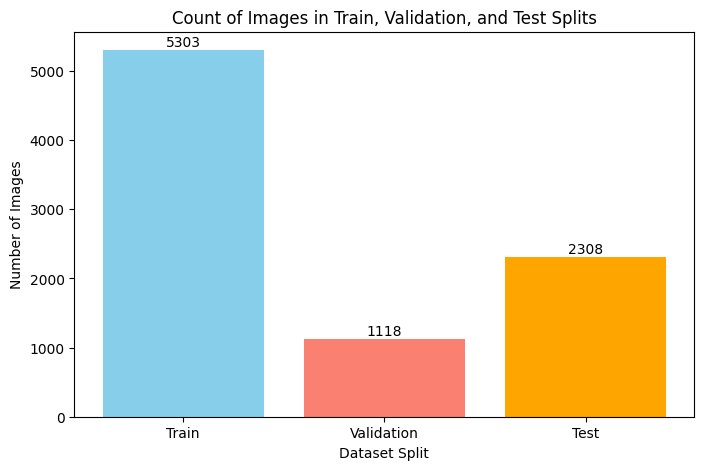

In [ ]:
# Count the number of entries in each split
split_counts = {
    'Train': len(train_df),
    'Validation': len(val_df),
    'Test': len(test_df)
}

# Plotting Split between Train, Test, Validation
plt.figure(figsize=(8, 5))
plt.bar(split_counts.keys(), split_counts.values(), color=['skyblue', 'salmon', 'orange'])
plt.xlabel("Dataset Split")
plt.ylabel("Number of Images")
plt.title("Count of Images in Train, Validation, and Test Splits")
plt.xticks(rotation=0)

# Add count labels on top of each bar
for i, count in enumerate(split_counts.values()):
    plt.text(i, count + 10, str(count), ha='center', va='bottom')

plt.show()

# Data Augmentation
Data Augmentation is done using Computer Vision and image processing techniques to enhance the image quality so that model predicts yield enhanced results. Following are the methods implemented:


*   MedianBlur is used to reduce noise and smoothen the image
*   Brightness of dark images are adjust so that turtles are visible
*   Image Contrasts are adjusted
*   Canny Edge detection and unsharp masking is applied to sharpen images
*   Random Cropping may be used if images are far



In [ ]:


# Create List of all Category ids and Image ids
image_ids = coco.getImgIds()
cat_ids = coco.getCatIds()

# Create a random seed for random cropping of images with far turtles
random.seed(13)


def reduce_noise(image):
    # Apply median blur to reduce salt-and-pepper noise
    return cv2.medianBlur(image, 3)  # Using 3x3 kernel size

def random_crop_if_far(id,image, min_area_ratio=0.1):
    ''' Randomly crops the image if the main object occupies a small area.
    - min_area_ratio: minimum area ratio (object area / image area) to avoid cropping.
    '''

    img_height, img_width = image.shape[:2]
    crop_image = image.copy()

    anns_ids = coco.getAnnIds(imgIds=id, catIds=cat_ids, iscrowd=None)
    annotations = coco.loadAnns(anns_ids)

    # Calculate the bounding box areas from annotations
    for ann in annotations:
        x, y, w, h = ann['bbox']  # Get bounding box (x, y, width, height)
        obj_area = w * h
        img_area = img_width * img_height

        # If object occupies a small area, perform a random crop
        if obj_area / img_area < min_area_ratio:
            # Define crop dimensions randomly
            x1 = np.random.randint(0, img_width // 4)
            y1 = np.random.randint(0, img_height // 4)
            x2 = np.random.randint(3 * img_width // 4, img_width)
            y2 = np.random.randint(3 * img_height // 4, img_height)

            # Crop the image
            crop_image = image[y1:y2, x1:x2]
            break  # Only perform one crop per image

    return crop_image


def conditional_brightness_adjustment(image, dark_threshold=50, bright_threshold=200, dark_factor=1.5, bright_factor=0.7):

    '''Adjusts brightness conditionally based on the initial brightness of the image.
    - A dark_factor is used to increase brightness for dark images (dark_factor 1.5 makes it 50% brighter).
    - A bright_factor is used decrease brightness for bright images (bright_factor 0.7 makes it 30% darker).
    '''


    # Convert the image to grayscale to calculate brightness
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    avg_brightness = np.mean(gray_image)

    # Brighten image if average brightness is below the dark threshold
    if avg_brightness < dark_threshold:
        adjusted_image = image.astype(np.float32) * dark_factor

    # Darkened the image if the average brightness is above bright_threshold
    elif avg_brightness > bright_threshold:
        adjusted_image = image.astype(np.float32) * bright_factor

    # No adjustment needed
    else:
        return image

    # Clip pixel values to be in valid range [0, 255] and convert back to uint8
    adjusted_image = np.clip(adjusted_image, 0, 255).astype(np.uint8)

    return adjusted_image

def conditional_contrast_adjustment(image, contrast_threshold=50, contrast_factor=1.2):
    """
    Conditionally adjusts the contrast of an image based on its current contrast level.
    - contrast_threshold: If the standard deviation of pixel intensities is below this, contrast is adjusted.
    - contrast_factor: Factor to adjust contrast if the image has low contrast.
    """
    # Convert the image to grayscale to assess contrast
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calculate the standard deviation of pixel intensities
    std_dev = np.std(gray_image)

    # Adjust contrast if below the threshold
    if std_dev < contrast_threshold:
        img_float = image.astype(np.float32)
        mean_brightness = np.mean(img_float)
        adjusted_image = (img_float - mean_brightness) * contrast_factor + mean_brightness
        adjusted_image = np.clip(adjusted_image, 0, 255).astype(np.uint8)

    # Else No change to the image
    else:
        adjusted_image = image

    return adjusted_image

def sharpen_image(image):
    """
    Sharpen the image to enhance edges and boundaries, helping model predictions.
    Apply Unsharp Masking and Canny Edge Detection to highlight edges).
    """
    # Apply Gaussian Blur first to reduce noise
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

    # Create a mild Sharpening kernel for basic sharpening
    sharpening_kernel = np.array([[0, -0.5, 0],
                                  [-0.5, 3, -0.5],
                                  [0, -0.5, 0]])

    sharpened_image = cv2.filter2D(blurred_image, -1, sharpening_kernel)

    # Apply Canny Edge Detection to highlight turtle boundaries
    edges = cv2.Canny(sharpened_image, threshold1=50, threshold2=150)

    # Use Unsharp Masking
    unsharp_mask = cv2.addWeighted(sharpened_image, 1.2, blurred_image, -0.2, 0)

    # Convert edges (1-channel) to 3-channel image to match the color image dimensions
    edges_colored = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

    # Combine sharpened image and edges with a balanced blend
    final_sharpened_image = cv2.addWeighted(unsharp_mask, 0.8, edges_colored, 0.2, 0)

    return final_sharpened_image


def augment_train_data(id,img_src_path):
  # Main function to augment Images
  image = cv2.imread(img_src_path)
  if image is None:
      print(f"Could not read {img_src_path}. Skipping.")

  # Apply transformations
  img1 = reduce_noise(image)
  img2 = conditional_brightness_adjustment(img1)
  img3 = conditional_contrast_adjustment(img2)
  img4 = sharpen_image(img3)
  # img5 = random_crop_if_far(id,img4) # Not used

  return img4

In [ ]:
# Create Yolo Folder Structure containing train, val and test directories
split_dir = os.path.join(base_dir, '/12_11/yolo_time_aware_split')
train_dir = os.path.join(split_dir, 'train')
val_dir = os.path.join(split_dir, 'val')
test_dir = os.path.join(split_dir, 'test')

# Create Images and Labels sub-directories for train, test and val directories
os.makedirs(split_dir, exist_ok=True)
for split in [train_dir, val_dir, test_dir]:
    os.makedirs(os.path.join(split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(split, 'labels'), exist_ok=True)

# Function to copy images and labels to the correct split directories based on Yolo structure
def copy_files(df, img_input_dir, label_dir, dest_dir, is_train_folder):

    # Iterate through all images in the dataframe
    for _, row in df.iterrows():
        id = row['id']
        subfolder = row['file_name'].split('/')[1]
        img_name = row['file_name'].split('/')[-1]
        label_name = img_name.rsplit('.', 1)[0] + '.txt'  # Corresponding label file name

        # Define source paths
        img_src_path = os.path.join(img_input_dir, subfolder, img_name)
        label_src_path = os.path.join(label_dir, label_name)

        # Define destination paths
        img_dest_path = os.path.join(dest_dir, 'images', img_name)
        label_dest_path = os.path.join(dest_dir, 'labels', label_name)

        if is_train_folder:
          # Perform Augmentation on images
          augmented_img = augment_train_data(id,img_src_path)
          if not os.path.exists(img_dest_path):
            # Write Augmented images to the destination folder
            cv2.imwrite(img_dest_path, augmented_img)

        else:
          # Copy image if it does not exist in destination folder to avoid duplicates
          if not os.path.exists(img_dest_path):
              shutil.copy2(img_src_path, img_dest_path)

        # Copy label if label does not exists in destination folder to avoid duplicates
        if os.path.exists(label_src_path) and not os.path.exists(label_dest_path):
            shutil.copy2(label_src_path, label_dest_path)
        print(f"Completed Processing of image {id}: {img_name}.")


# Copy image files for each split (train, test and val)
copy_files(train_df, img_input_dir, label_dir, train_dir, True)
copy_files(val_df, img_input_dir, label_dir, val_dir, False)
copy_files(test_df, img_input_dir, label_dir, test_dir, False)

print("Time-aware dataset split into train, val, and test directories.")


Streaming output truncated to the last 5000 lines.
Completed Processing of image 793: WhaxiWlgpa.JPG.
Completed Processing of image 656: munMxJWBmv.JPG.
Completed Processing of image 646: JTJKQFRXOp.JPG.
Completed Processing of image 655: fkCJiGTmMn.JPG.
Completed Processing of image 648: LfYoVdnJnv.JPG.
Completed Processing of image 653: aOLVtaQzri.JPG.
Completed Processing of image 654: evyGuCgwCE.JPG.
Completed Processing of image 650: RREaEUkiZS.JPG.
Completed Processing of image 652: SRHvTKWSyV.JPG.
Completed Processing of image 805: QqSAUnpEvT.JPG.
Completed Processing of image 802: LnxiRjHBnl.JPG.
Completed Processing of image 808: SlLnLPoDgz.JPG.
Completed Processing of image 812: VyPTbjOmqr.JPG.
Completed Processing of image 813: YAUbbfaTYO.JPG.
Completed Processing of image 819: dbeQtkcsZR.JPG.
Completed Processing of image 861: sHRqHpLgBP.JPG.
Completed Processing of image 865: uHxbYeNSBq.JPG.
Completed Processing of image 839: LJLBKuXMrP.JPG.
Completed Processing of image 8

In [ ]:
# Check all images have been split into corresponding folders
!ls -1 {os.path.join(train_dir, 'images')} | wc -l
!ls -1 {os.path.join(train_dir, 'labels')} | wc -l

!ls -1 {os.path.join(test_dir, 'images')} | wc -l
!ls -1 {os.path.join(test_dir, 'labels')} | wc -l

!ls -1 {os.path.join(val_dir, 'images')} | wc -l
!ls -1 {os.path.join(val_dir, 'labels')} | wc -l

1527
1527
219
219
436
436


# Training YOLO Model
yolov8s-seg.pt model is used for image segmentation. To train the model a yaml file is created with the paths of train, test and val folders. The yolo model is then loaded and trained on the pre-processed and augmented turtles dataset.

In [ ]:
# Create yaml file containing paths and categories as required by yolo
yolo_path = base_dir + "12_11/yolo_time_aware_split"

yaml_content = f"""
path: {yolo_path}
train: {yolo_path}/train
test: {yolo_path}/test
val:  {yolo_path}/val

names:
    0: turtle
    1: flipper
    2: head

"""
# Save Yaml file
yaml_path = base_dir+'/data.yaml'
with open(yaml_path, 'w') as file:
    file.write(yaml_content)

print(f"Created yaml file: {yaml_path}")

Created yaml file: /content/drive/MyDrive/turtles/turtles-data//data.yaml


In [ ]:
# Load the Baseline YOLO model
model = YOLO("yolov8s-seg.pt")

# Define paths for train, val, and test data using the custom data.yaml file
yaml_path = base_dir + '/data.yaml'

# Train the model on the custom dataset
results = model.train(data=yaml_path, epochs=3, batch=8, imgsz=640, optimizer='Adam')

# Save model checkpoint after training
saved_model_path = base_dir + '12_11/yolo_model_12_11.pt'
model.save(saved_model_path)

# Validate the model on the validation set
val_results = model.val(data=yaml_path)

Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=/content/drive/MyDrive/turtles/turtles-data/12_11/yolo_model_12_11.pt, data=/content/drive/MyDrive/turtles/turtles-data//data.yaml, epochs=3, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train27, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_t

100%|██████████| 755k/755k [00:00<00:00, 112MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256

train: Scanning /content/drive/MyDrive/turtles/turtles-data/yolo_time_aware_split/train/labels... 1527 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1527/1527 [20:55<00:00,  1.22it/s]


train: New cache created: /content/drive/MyDrive/turtles/turtles-data/yolo_time_aware_split/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/turtles/turtles-data/yolo_time_aware_split/val/labels... 436 images, 0 backgrounds, 0 corrupt: 100%|██████████| 436/436 [06:10<00:00,  1.18it/s]


val: New cache created: /content/drive/MyDrive/turtles/turtles-data/yolo_time_aware_split/val/labels.cache
Plotting labels to runs/segment/train27/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train27
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


        1/3      2.69G      1.013      1.591     0.9723      1.145         43        640: 100%|██████████| 191/191 [01:23<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:10<00:00,  2.55it/s]


                   all        436       2005      0.535      0.329      0.325      0.185      0.512      0.297      0.306      0.184

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


        2/3      2.72G      1.034      1.548     0.9325      1.157         62        640: 100%|██████████| 191/191 [01:17<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:11<00:00,  2.46it/s]


                   all        436       2005      0.786      0.689      0.765       0.54      0.775      0.647      0.722      0.505

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


        3/3      2.66G     0.8832      1.322     0.7761      1.078         72        640: 100%|██████████| 191/191 [01:17<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:12<00:00,  2.17it/s]


                   all        436       2005       0.89      0.809      0.864      0.671      0.873      0.791      0.838      0.639

3 epochs completed in 0.080 hours.
Optimizer stripped from runs/segment/train27/weights/last.pt, 23.8MB
Optimizer stripped from runs/segment/train27/weights/best.pt, 23.8MB

Validating runs/segment/train27/weights/best.pt...
Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,780,761 parameters, 0 gradients, 42.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:15<00:00,  1.79it/s]


                   all        436       2005       0.89      0.808      0.864      0.671      0.873      0.791      0.838       0.64
                turtle        436        466      0.887      0.882      0.909      0.738      0.833      0.828      0.837      0.636
               flipper        436       1111      0.874      0.642      0.736      0.527      0.876      0.643      0.732      0.527
                  head        427        428      0.908        0.9      0.947      0.747       0.91      0.902      0.947      0.756
Speed: 0.3ms preprocess, 5.4ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to runs/segment/train27
Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,780,761 parameters, 0 gradients, 42.4 GFLOPs


val: Scanning /content/drive/MyDrive/turtles/turtles-data/yolo_time_aware_split/val/labels.cache... 436 images, 0 backgrounds, 0 corrupt: 100%|██████████| 436/436 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 55/55 [00:18<00:00,  2.97it/s]


                   all        436       2005      0.891      0.809      0.864      0.671      0.874      0.792      0.839      0.637
                turtle        436        466      0.889      0.884      0.911      0.738      0.835       0.83      0.836      0.635
               flipper        436       1111      0.875      0.642      0.736      0.528      0.876      0.643      0.732      0.524
                  head        427        428      0.908        0.9      0.946      0.747       0.91      0.902      0.947      0.751
Speed: 0.4ms preprocess, 11.7ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/segment/train272


# Predict Model Results (Testing and Evaluation)
Model results are predicted using the trained yolo model.
The model results are evaluated across the entire test set by calculating IoU score across the 3 categories (head, flipper, carapace/turtle).
The segmented masks generated by the model are compared with the ground truth masks for each of the 3 categories and the IoU score is also computed for the same.

In [ ]:
from ultralytics import YOLO

saved_model_path = base_dir + '/12_11/yolo_model_12_11.pt'
model = YOLO(saved_model_path)

test_dir = base_dir + '/12_11/yolo_time_aware_split/test/images'

# Using YOLO model with streaming to avoid memory overload
test_results = model(source=f"{test_dir}", stream=True)  # Enable streaming to prevent RAM accumulation

for r in test_results:
    boxes = r.boxes  # Get bounding boxes
    masks = r.masks  # Get segmentation masks
    probs = r.probs  # Get classification probabilities


image 1/2308 /content/drive/MyDrive/turtles/turtles-data/14_11/yolo_time_aware_split/test/images/ABZIHuoAbI.JPG: 448x640 1 turtle, 812.7ms
image 2/2308 /content/drive/MyDrive/turtles/turtles-data/14_11/yolo_time_aware_split/test/images/ABlZjzruvy.JPG: 448x640 (no detections), 550.3ms
image 3/2308 /content/drive/MyDrive/turtles/turtles-data/14_11/yolo_time_aware_split/test/images/AEjzutgwHs.JPG: 448x640 (no detections), 754.1ms
image 4/2308 /content/drive/MyDrive/turtles/turtles-data/14_11/yolo_time_aware_split/test/images/AFPzMoMJhV.jpeg: 448x640 (no detections), 778.7ms
image 5/2308 /content/drive/MyDrive/turtles/turtles-data/14_11/yolo_time_aware_split/test/images/AHxkptpcqw.JPG: 448x640 1 turtle, 742.2ms
image 6/2308 /content/drive/MyDrive/turtles/turtles-data/14_11/yolo_time_aware_split/test/images/AIlHqRgRfF.JPG: 448x640 (no detections), 672.3ms
image 7/2308 /content/drive/MyDrive/turtles/turtles-data/14_11/yolo_time_aware_split/test/images/AJRcjhvvAQ.jpeg: 448x640 1 turtle, 536.

In [ ]:
saved_model_path = base_dir + '/12_11/yolo_model_12_11.pt'
model = YOLO(saved_model_path)

test_dir = base_dir + '/12_11/yolo_time_aware_split/test/images'

# Using YOLO model with streaming to avoid memory overload
test_results = model(source=f"{test_dir}", stream=True)  # Enable streaming to prevent RAM accumulation


Display Ground Truth and Predicted Masks

{'id': 36796, 'image_id': 8382, 'category_id': 1, 'segmentation': {'counts': [984414, 11, 174, 19, 1126, 18, 162, 30, 1122, 21, 153, 39, 1119, 23, 146, 48, 1115, 26, 140, 53, 1113, 28, 133, 61, 1111, 29, 127, 67, 1109, 31, 122, 73, 1107, 33, 116, 78, 1105, 35, 112, 82, 1104, 36, 107, 86, 1103, 38, 103, 89, 1103, 39, 99, 93, 1102, 40, 95, 96, 1101, 42, 90, 100, 1101, 43, 86, 103, 1101, 44, 83, 105, 1101, 46, 79, 106, 1102, 47, 76, 107, 1103, 47, 74, 108, 1103, 49, 72, 107, 1105, 50, 69, 108, 1106, 50, 68, 107, 1108, 51, 66, 106, 1110, 52, 63, 106, 1112, 53, 61, 105, 1114, 54, 58, 104, 1117, 54, 57, 103, 1119, 55, 55, 101, 1122, 55, 54, 99, 1125, 56, 51, 91, 1135, 56, 50, 88, 1139, 57, 48, 84, 1144, 57, 47, 81, 1148, 58, 45, 79, 1152, 57, 44, 78, 1154, 58, 43, 77, 1155, 58, 42, 76, 1157, 59, 40, 75, 1159, 59, 40, 72, 1162, 60, 38, 71, 1164, 60, 37, 69, 1167, 60, 37, 67, 1169, 61, 35, 65, 1172, 61, 35, 63, 1174, 61, 34, 61, 1177, 62, 32, 60, 1179, 62, 32, 59, 1180, 62, 32, 57, 1183, 62, 3

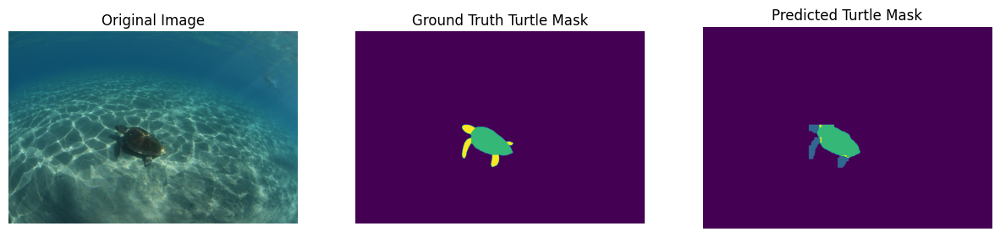

In [ ]:
# Display Original Turtle Mask and Predicted Mask

sample_mask_img = [8382]  # 8677,8382, 6842, 8677

# Filter for selected image IDs
selected_df = test_df[test_df['id'].isin(sample_mask_img)]

def display_sample_masks(test_df, model, coco_data):
    for _, img_data in test_df.iterrows():
        img_id = img_data['id']
        img_name = img_data['file_name'].split('/')[-1]
        img_path = os.path.join(test_dir, img_name)
        img_shape = (img_data['height'], img_data['width'])

        # Load the original image
        image = cv2.imread(img_path)

        plt.figure(figsize=(15, 5))

        # Display the original image
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis('off')

        # Display the true mask
        plt.subplot(1, 3, 2)

        img = coco.imgs[img_id]
        image = np.array(Image.open(test_dir+'/'+img_name))
        plt.imshow(image, interpolation='nearest')
        cat_ids = coco.getCatIds()

        # Overlay annotation
        anns_ids = coco.getAnnIds(imgIds=img['id'], catIds=cat_ids, iscrowd=None)
        anns = coco.loadAnns(anns_ids)
        coco.showAnns(anns)
        true_mask = coco.annToMask(anns[0])
        for i in range(len(anns)):
            print(anns[i])
            true_mask += coco.annToMask(anns[i])

        plt.imshow(true_mask)
        plt.title("Ground Truth Turtle Mask")
        plt.axis('off')


        # Display the predicted mask
        plt.subplot(1, 3, 3)

        # Predict with YOLO model
        results = model.predict(img_path, show_labels=True, show_boxes=False)

        if results[0].masks.data is None:
            print(f"No masks found for image: {img_id}: {img_path}")
            continue
        pred_mask =  results[0].masks.data[0].cpu().numpy()
        for i in range(0,len(results[0].masks.data)):
          pred_mask+=results[0].masks.data[i].cpu().numpy()


        plt.imshow(pred_mask)
        plt.title("Predicted Turtle Mask")
        plt.axis('off')
        # plt.show()

# Run the function on the selected samples
display_sample_masks(selected_df, model, coco)


Calculate IoU Scores and Display Segmentation Masks

In [ ]:


# Define the model and paths
test_dir = base_dir + '12_11/yolo_time_aware_split/test/images'
saved_model_path = base_dir + '12_11/yolo_model_12_11.pt'
model = YOLO(saved_model_path)

# Create Time Aware Splits for ids using Metadata
metadata_df = pd.read_csv(base_dir+'metadata_splits.csv')
test_df = metadata_df[metadata_df['split_open'] == 'test']

image_ids = coco.getImgIds()
cat_ids = coco.getCatIds()

# Function to Calculate IOU on predicted and true masks
def calculate_iou(pred_mask, true_mask):
    intersection = np.logical_and(pred_mask, true_mask).sum()
    union = np.logical_or(pred_mask, true_mask).sum()
    return intersection / union if union > 0 else 0

# Function To Display Mask Overlay on original image
def plot_mask_overlay(image, pred_mask, true_mask, title):
    plt.figure(figsize=(15, 5))

    # Display original image
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')

    # Display true mask overlay
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.imshow(true_mask, alpha=0.5, cmap="Blues")
    plt.title("Ground Truth Mask")
    plt.axis('off')

    # Display predicted mask overlay
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.imshow(pred_mask, alpha=0.5, cmap="Reds")
    plt.title(title)
    plt.axis('off')

    plt.show()


In [ ]:

# Function to calculate the Mean IOU for Each Category and entire turtle in the Test Dataset
def compute_category_miou(test_df, model, coco_data):
    # Initialise IOU lists for each category and entire turtle
    iou_results = []
    head_ious, flippers_ious, carapace_ious, turtle_ious, avg_ious = [], [], [], [], []
    total_imgz = len(test_df)
    count = 0

    # Iterate through all test images
    for _, img_data in test_df.iterrows():
        img_has_masks = True
        img_id = img_data['id']
        img_name = img_data['file_name'].split('/')[-1]
        img_path = os.path.join(test_dir, img_name)
        img_shape = (img_data['height'], img_data['width'])

        # Load and prepare the image
        image = cv2.imread(img_path)

        # Load ground-truth annotations and get true masks for the image
        anns_ids = coco_data.getAnnIds(imgIds=img_id, iscrowd=None)
        anns = coco_data.loadAnns(anns_ids)

        true_head_mask, true_flippers_mask, true_carapace_mask, true_turtle_mask = np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8)
        # Iterate through each annotation in image and get annotation mask for each category
        for ann in anns:
            category_id = ann['category_id']
            mask = coco_data.annToMask(ann)  # Directly convert RLE to binary mask

            # Resize mask if needed
            mask_resized = cv2.resize(mask, (img_shape[1], img_shape[0]), interpolation=cv2.INTER_NEAREST)

            # Store category mask
            if category_id == 3:  # Head
                true_head_mask |= mask_resized
            elif category_id == 2:  # Flippers
                true_flippers_mask |= mask_resized
            elif category_id == 1:  # Entire Turtle
                true_turtle_mask |= mask_resized

        # Calculate true carapace mask by subtracting head and flipper mask from turtle
        true_carapace_mask = true_turtle_mask & ~(true_head_mask | true_flippers_mask)


        # Get Predict Masks from YOLO model created
        results = model.predict(img_path)
        pred_head_mask, pred_flippers_mask, pred_carapace_mask, pred_turtle_mask = np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8)

        # Iterate through all predicted results for an image
        for result in results:

            # Skip image if no masks are present in predicted results
            if result.masks is None or result.masks.data is None:
                print(f"No masks found for image: {img_id}: {img_path}")
                img_has_masks = False
                break

            # Get predicted Mask for each category
            masks = result.masks.data.cpu().numpy()  # Predicted masks
            categories = result.boxes.cls.cpu().numpy()  # Predicted categories

            for mask, category_id in zip(masks, categories):
                mask_resized = cv2.resize(mask, (img_shape[1], img_shape[0])) > 0.5  # Threshold mask

                # Store predicted mask based on category
                if category_id == 2:  # Head
                    pred_head_mask |= mask_resized
                elif category_id == 1:  # Flippers
                    pred_flippers_mask |= mask_resized
                elif category_id == 0:  # Carapce
                    pred_carapace_mask |= mask_resized

        # Continue to next image if no masks found for image.
        if not img_has_masks:
            img_has_masks = True
            count+=1
            print(f"{count} / {total_imgz}: No Masks found")
            continue

        # Calculate the predicted turtle mask as the union of head, flippers, and carapace
        pred_turtle_mask = pred_head_mask | pred_flippers_mask | pred_carapace_mask

        # Calculate IoU for each category and plot
        head_iou = calculate_iou(pred_head_mask, true_head_mask)
        flippers_iou = calculate_iou(pred_flippers_mask, true_flippers_mask)
        carapace_iou = calculate_iou(pred_carapace_mask, true_carapace_mask)
        turtle_iou = calculate_iou(pred_turtle_mask, true_turtle_mask)
        avg_iou = (head_iou + flippers_iou + carapace_iou)/3

        head_ious.append(head_iou)
        flippers_ious.append(flippers_iou)
        carapace_ious.append(carapace_iou)
        turtle_ious.append(turtle_iou)
        avg_ious.append(avg_iou)


        # # Display the True and Predicted Masks for each category and entire turtle
        # plot_mask_overlay(image, pred_head_mask, true_head_mask, f"Predicted Head Mask\nIoU: {head_iou:.4f}")
        # plot_mask_overlay(image, pred_flippers_mask, true_flippers_mask, f"Predicted Flippers Mask\nIoU: {flippers_iou:.4f}")
        # plot_mask_overlay(image, pred_carapace_mask, true_carapace_mask, f"Predicted Carapace Mask\nIoU: {carapace_iou:.4f}")
        # plot_mask_overlay(image, pred_turtle_mask, true_turtle_mask, f"Predicted Entire Turtle Mask\nIoU: {turtle_iou:.4f}")

        # Append iou results for the image to list
        iou_results.append({
            'image_id': img_id,
            'image_name': img_name,
            'image_path': img_path,
            'head_iou': head_iou,
            'flipper_iou': flippers_iou,
            'carapace_iou': carapace_iou,
            'turtle_iou': turtle_iou,
            'avg_iou (3 categories)': avg_iou
        })

        # Print iou
        count+=1
        print(f"{count} / {total_imgz} - Img Id {img_id}:\nHead IOU = {head_iou}, Flipper IOU = {flippers_iou}, Carapace IOU = {carapace_iou}, Total Turtle IOU = {turtle_iou}, Avg IoU across 3 categories = {avg_iou}")

    # Compute mean IoU for all images across each category
    head_miou = np.mean(head_ious)
    flippers_miou = np.mean(flippers_ious)
    carapace_miou = np.mean(carapace_ious)
    turtle_miou = np.mean(turtle_ious)
    avg_miou = np.mean(avg_ious)

    return head_miou, flippers_miou, carapace_miou, turtle_miou, avg_miou, iou_results

# Get Mean IOU for all categories and entire turtle
head_miou, flippers_miou, carapace_miou, turtle_miou, avg_miou, iou_results = compute_category_miou(test_df, model, coco)



Streaming output truncated to the last 5000 lines.

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/jIVlbpPKNh.jpeg: 448x640 1 turtle, 3 flippers, 1 head, 524.5ms
Speed: 3.0ms preprocess, 524.5ms inference, 13.1ms postprocess per image at shape (1, 3, 448, 640)
1309 / 2308:
Head IOU = 0.9169087055498861, Flipper IOU = 0.8291938952766978, Carapace IOU = 0.9199779832008806, Total Turtle IOU = 0.9340124147096481

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/KnNPlxHbOG.jpeg: 448x640 1 turtle, 3 flippers, 1 head, 531.5ms
Speed: 3.3ms preprocess, 531.5ms inference, 13.3ms postprocess per image at shape (1, 3, 448, 640)
1310 / 2308:
Head IOU = 0.9176522028816524, Flipper IOU = 0.8377936653623819, Carapace IOU = 0.941734278433555, Total Turtle IOU = 0.9304943107505017

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/rVXIYAxMmu.jpeg: 448x640 2 turtles, 3 f

In [ ]:
# Print Mean iou for all 3 categories and Entire Turtle
print(f"\nHead mean IoU: {head_miou:.4f}")
print(f"Flippers mean IoU: {flippers_miou:.4f}")
print(f"Carapace mean IoU: {carapace_miou:.4f}")
print(f"Total Turtle mean IoU: {turtle_miou:.4f}")
print(f"Average mean IoU (3 classes): {avg_miou:.4f}")


# Create a Dataframe for the iou results of all images.
results_df = pd.DataFrame(iou_results)

# Write DataFrame to CSV
output_csv_path = base_dir + '/12_11/test_iou_results.csv'
results_df.to_csv(output_csv_path, index=False)


Head mean IoU: 0.6793
Flippers mean IoU: 0.6703
Carapace mean IoU: 0.8028
Total Turtle mean IoU: 0.8505
Average mean IoU (3 classes): 0.7175


In [ ]:
from tabulate import tabulate

# Show IoU Scores for each category and entire Turtle
data = [
    ["Head", f"{head_miou:.4f}"],
    ["Flippers", f"{flippers_miou:.4f}"],
    ["Carapace", f"{carapace_miou:.4f}"],
    ["Total Turtle", f"{turtle_miou:.4f}"]
]

# Display the Mean IOU as a table
print(tabulate(data, headers=["Category", "Mean IoU"], tablefmt="grid"))


+--------------+------------+
| Category     |   Mean IoU |
+==============+============+
| Head         |     0.6793 |
+--------------+------------+
| Flippers     |     0.6703 |
+--------------+------------+
| Carapace     |     0.8028 |
+--------------+------------+
| Total Turtle |     0.8505 |
+--------------+------------+


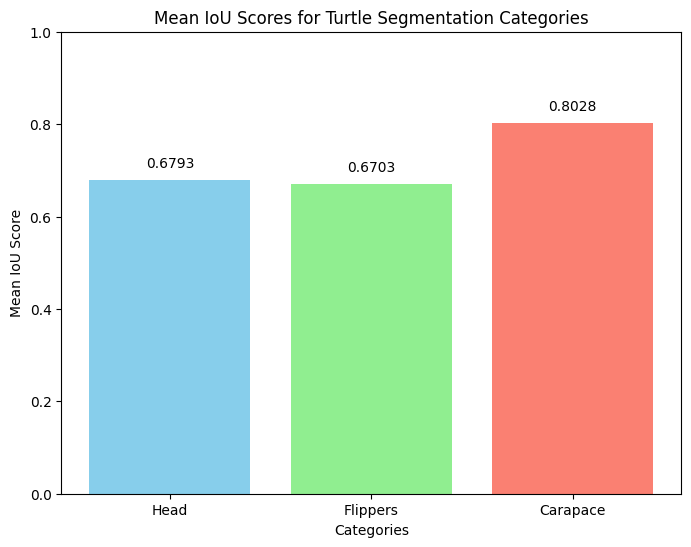

In [ ]:

# Display Mean IoU scores for each category
categories = ['Head', 'Flippers', 'Carapace']
miou_scores = [head_miou, flippers_miou, carapace_miou]

# Plotting the bar graph
plt.figure(figsize=(8, 6))
plt.bar(categories, miou_scores, color=['skyblue', 'lightgreen', 'salmon'])

# Adding labels and title
plt.xlabel('Categories')
plt.ylabel('Mean IoU Score')
plt.title('Mean IoU Scores for Turtle Segmentation Categories')
plt.ylim(0, 1)

# Display values on top of each bar
for i, score in enumerate(miou_scores):
    plt.text(i, score + 0.02, f"{score:.4f}", ha='center', va='bottom')

# Show the plot
plt.show()

Display Successful  Segmentation Results

Images that have Successful Segmentation Results
6842

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/avpMpvawbu.jpeg: 448x640 1 turtle, 2 flippers, 1 head, 17.3ms
Speed: 3.1ms preprocess, 17.3ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


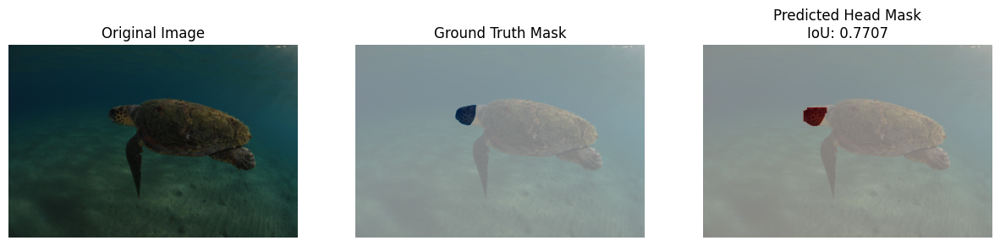

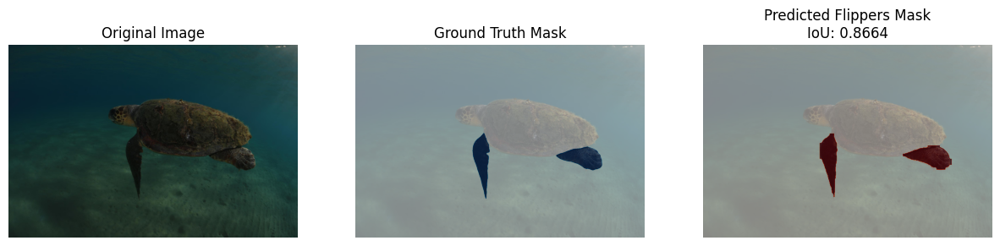

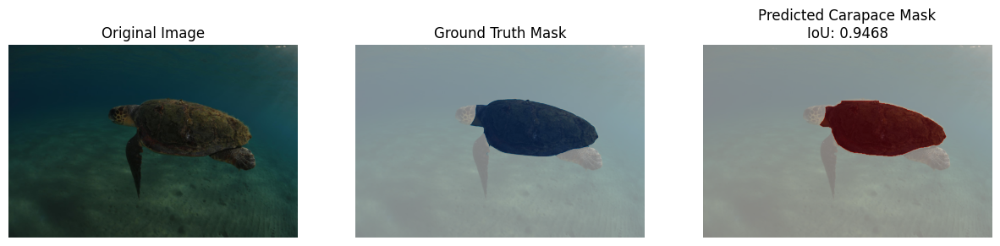

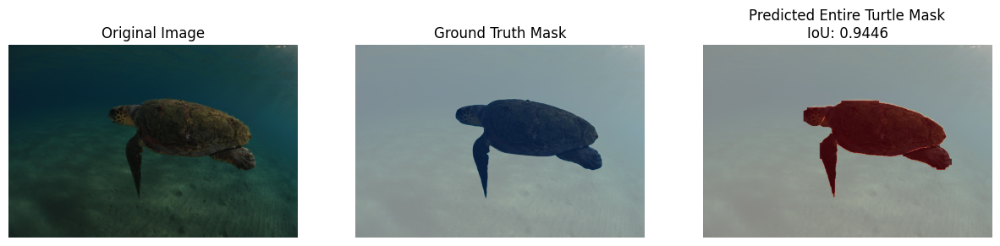

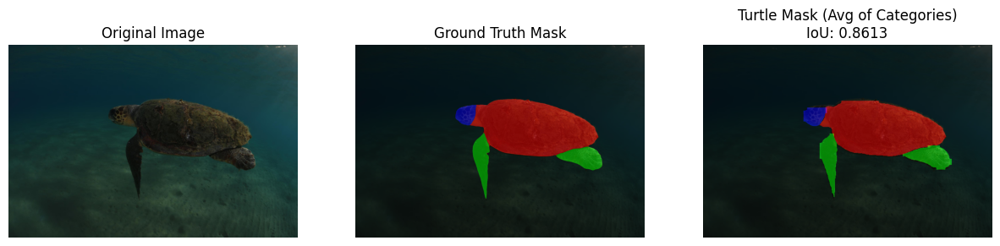

1 / 4:
Head IOU = 0.7707379703025566, Flipper IOU = 0.8663667242714975, Carapace IOU = 0.9468349779760312, Total Turtle IOU = 0.9446401336335246, Avg IoU of 3 Categories = 0.8613132241833618
8337

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/AFPzMoMJhV.jpeg: 448x640 1 turtle, 2 flippers, 1 head, 16.5ms
Speed: 2.3ms preprocess, 16.5ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


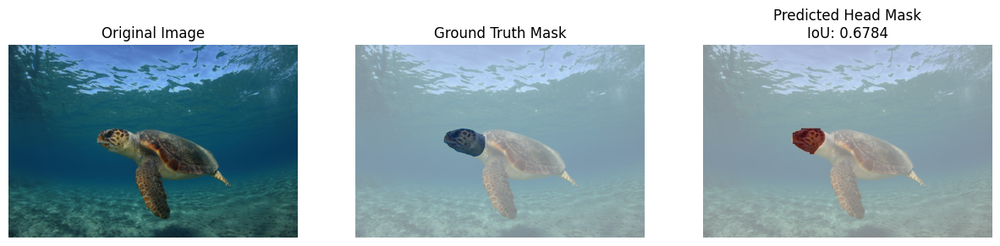

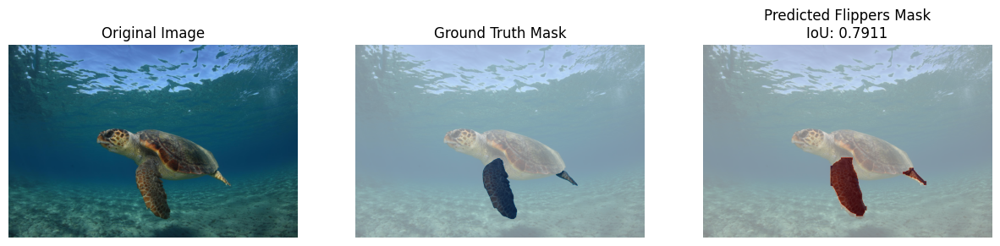

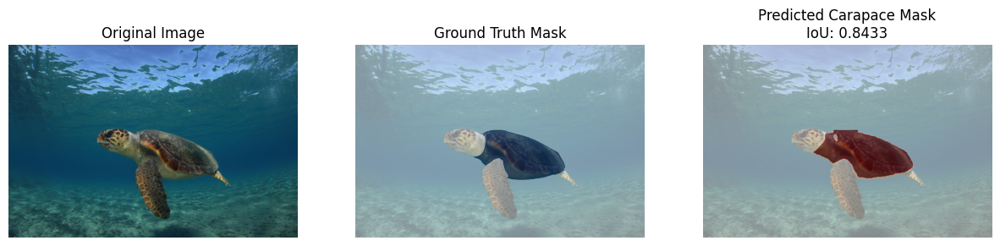

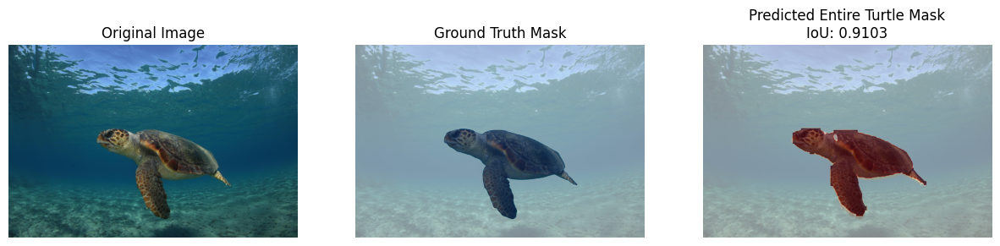

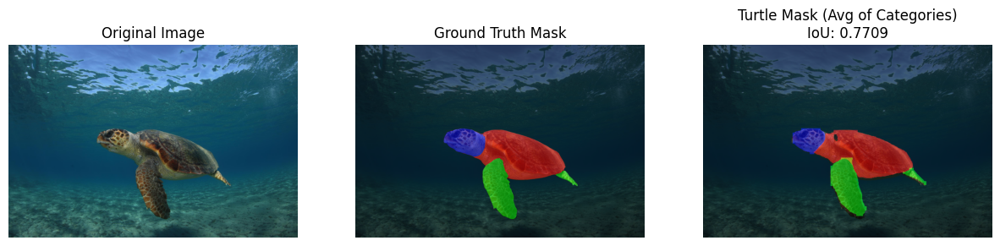

2 / 4:
Head IOU = 0.6784032508664993, Flipper IOU = 0.7910793070052727, Carapace IOU = 0.8433114337397198, Total Turtle IOU = 0.9102941886865369, Avg IoU of 3 Categories = 0.7709313305371639
8382

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/aiesKGFgis.jpeg: 448x640 1 turtle, 2 flippers, 1 head, 18.4ms
Speed: 3.9ms preprocess, 18.4ms inference, 4.6ms postprocess per image at shape (1, 3, 448, 640)


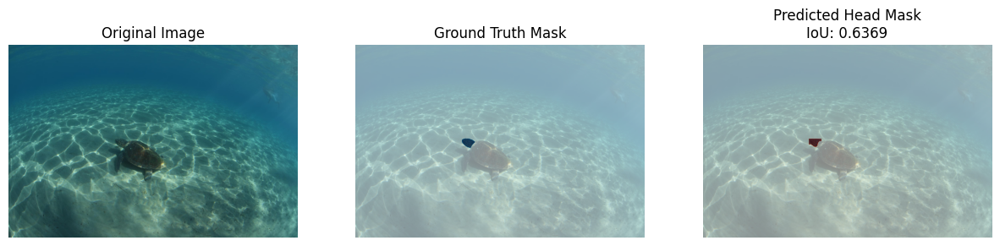

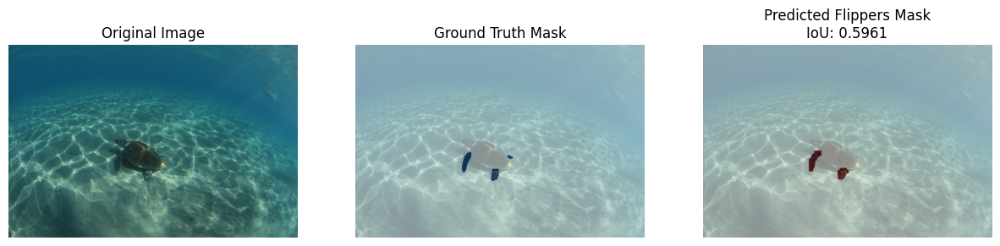

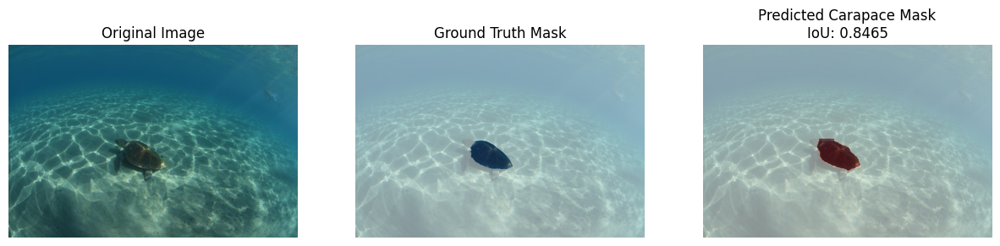

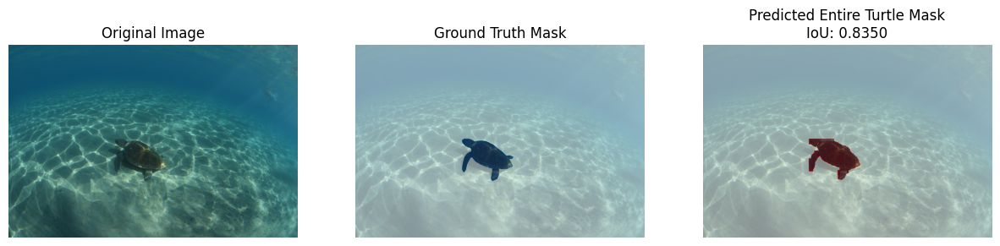

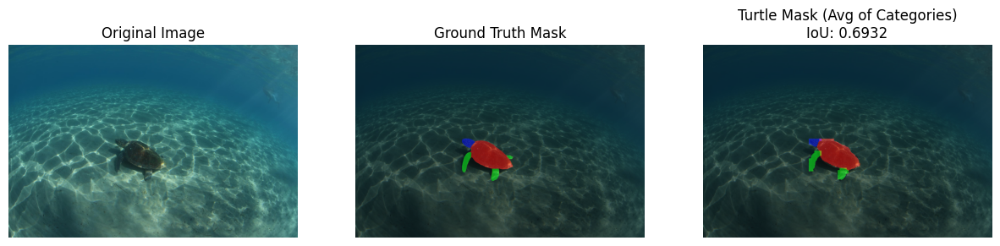

3 / 4:
Head IOU = 0.6368605159597727, Flipper IOU = 0.5960907077956784, Carapace IOU = 0.8465371896977318, Total Turtle IOU = 0.8349564857024451, Avg IoU of 3 Categories = 0.6931628044843943
8677

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/aIUPDIybYq.jpeg: 448x640 1 turtle, 3 flippers, 1 head, 16.6ms
Speed: 4.2ms preprocess, 16.6ms inference, 2.9ms postprocess per image at shape (1, 3, 448, 640)


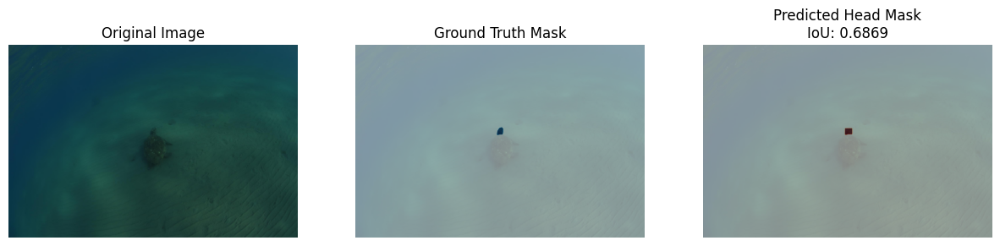

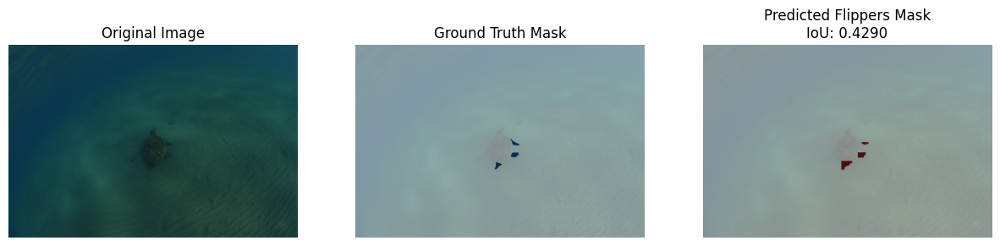

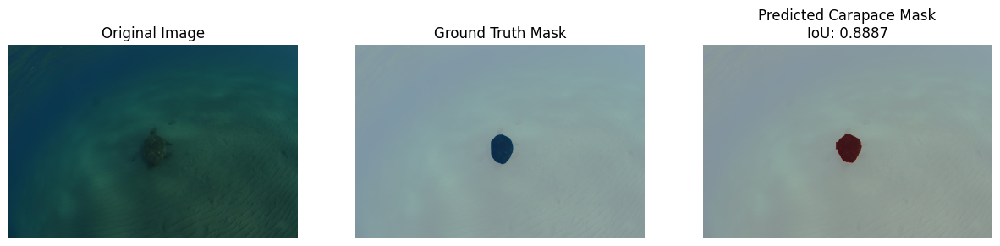

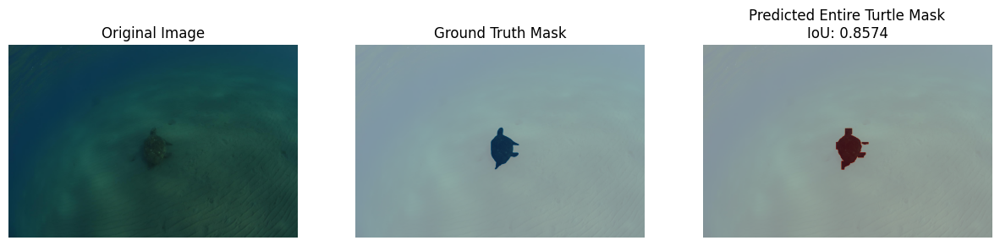

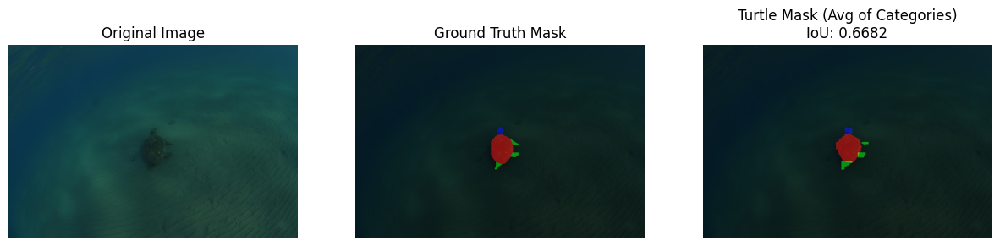

4 / 4:
Head IOU = 0.6868600682593856, Flipper IOU = 0.4289973324964695, Carapace IOU = 0.8886879873432026, Total Turtle IOU = 0.8574208226067174, Avg IoU of 3 Categories = 0.6681817960330192


In [ ]:
# Display Successful Segmentation Results

# Define the model and paths
test_dir = base_dir + '12_11/yolo_time_aware_split/test/images'
saved_model_path = base_dir +  '12_11/yolo_model_12_11.pt'
model = YOLO(saved_model_path)


# Define list of selected image IDs
good_img_ids = [8337, 8677,8382, 6842, 8677]

# Filter for selected image IDs
selected_df = test_df[test_df['id'].isin(good_img_ids)]


# Function to calculate the Mean IOU for Each Category and entire turtle in the Test Dataset and display the Mask overlay
def compute_and_display_category_miou(test_df, model, coco_data):
    # Initialise IOU lists for each category and entire turtle
    iou_results = []
    head_ious, flippers_ious, carapace_ious, turtle_ious, avg_ious = [], [], [], [], []
    total_imgz = len(test_df)
    count = 0

    # Iterate through all test images
    for _, img_data in test_df.iterrows():
        img_has_masks = True
        img_id = img_data['id']
        img_name = img_data['file_name'].split('/')[-1]
        img_path = os.path.join(test_dir, img_name)
        img_shape = (img_data['height'], img_data['width'])
        print(img_id)

        # Load and prepare the image
        image = cv2.imread(img_path)

        # Load ground-truth annotations and get true masks for the image
        anns_ids = coco_data.getAnnIds(imgIds=img_id, iscrowd=None)
        anns = coco_data.loadAnns(anns_ids)

        true_head_mask, true_flippers_mask, true_carapace_mask, true_turtle_mask = np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8)
        # Iterate through each annotation in image and get annotation mask for each category
        for ann in anns:
            category_id = ann['category_id']
            mask = coco_data.annToMask(ann)  # Directly convert RLE to binary mask

            # Resize mask if needed
            mask_resized = cv2.resize(mask, (img_shape[1], img_shape[0]), interpolation=cv2.INTER_NEAREST)

            # Store category mask
            if category_id == 3:  # Head
                true_head_mask |= mask_resized
            elif category_id == 2:  # Flippers
                true_flippers_mask |= mask_resized
            elif category_id == 1:  # Entire Turtle
                true_turtle_mask |= mask_resized

        # Calculate true carapace mask by subtracting head and flipper mask from turtle
        true_carapace_mask = true_turtle_mask & ~(true_head_mask | true_flippers_mask)


        # Get Predict Masks from YOLO model created
        results = model.predict(img_path)
        pred_head_mask, pred_flippers_mask, pred_carapace_mask, pred_turtle_mask = np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8), np.zeros(img_shape, dtype=np.uint8)

        # Iterate through all predicted results for an image
        for result in results:

            # Skip image if no masks are present in predicted results
            if result.masks is None or result.masks.data is None:
                print(f"No masks found for image: {img_id}: {img_path}")
                img_has_masks = False
                break

            # Get predicted Mask for each Cateogries
            masks = result.masks.data.cpu().numpy()  # Predicted masks
            categories = result.boxes.cls.cpu().numpy()  # Predicted categories

            for mask, category_id in zip(masks, categories):
                mask_resized = cv2.resize(mask, (img_shape[1], img_shape[0])) > 0.5  # Threshold mask

                # Store predicted mask based on category
                if category_id == 2:  # Head
                    pred_head_mask |= mask_resized
                elif category_id == 1:  # Flippers
                    pred_flippers_mask |= mask_resized
                elif category_id == 0:  # Carapce
                    pred_carapace_mask |= mask_resized

        # Continue to next image if no masks found for image.
        if not img_has_masks:
            img_has_masks = True
            count+=1
            print(f"{count} / {total_imgz}: No Masks found")
            continue

        # Calculate the predicted turtle mask as the union of head, flippers, and carapace
        pred_turtle_mask = pred_head_mask | pred_flippers_mask | pred_carapace_mask

        # Calculate IoU for each category and plot
        head_iou = calculate_iou(pred_head_mask, true_head_mask)
        flippers_iou = calculate_iou(pred_flippers_mask, true_flippers_mask)
        carapace_iou = calculate_iou(pred_carapace_mask, true_carapace_mask)
        turtle_iou = calculate_iou(pred_turtle_mask, true_turtle_mask)
        avg_iou = np.mean([head_iou, flippers_iou, carapace_iou])

        head_ious.append(head_iou)
        flippers_ious.append(flippers_iou)
        carapace_ious.append(carapace_iou)
        turtle_ious.append(turtle_iou)
        avg_ious.append(avg_iou)

        # Combine masks into a single image
        overall_mask = np.zeros((pred_carapace_mask.shape[0], pred_carapace_mask.shape[1], 3), dtype=np.uint8)
        overall_mask[:,:,0] = (pred_carapace_mask * 255).astype(np.uint8)
        overall_mask[:,:,1] =  (pred_flippers_mask * 255).astype(np.uint8)   # Green for flippers
        overall_mask[:,:,2] = (pred_head_mask * 255).astype(np.uint8)

        overall_true_mask = np.zeros((true_head_mask.shape[0], true_head_mask.shape[1], 3), dtype=np.uint8)
        overall_true_mask[:,:,0] = (true_carapace_mask * 255).astype(np.uint8)
        overall_true_mask[:,:,1] = (true_flippers_mask * 255).astype(np.uint8)
        overall_true_mask[:,:,2] = (true_head_mask * 255).astype(np.uint8)

        # Display the True and Predicted Masks for each category and entire turtle
        plot_mask_overlay(image, pred_head_mask, true_head_mask, f"Predicted Head Mask\nIoU: {head_iou:.4f}")
        plot_mask_overlay(image, pred_flippers_mask, true_flippers_mask, f"Predicted Flippers Mask\nIoU: {flippers_iou:.4f}")
        plot_mask_overlay(image, pred_carapace_mask, true_carapace_mask, f"Predicted Carapace Mask\nIoU: {carapace_iou:.4f}")
        plot_mask_overlay(image, pred_turtle_mask, true_turtle_mask, f"Predicted Entire Turtle Mask\nIoU: {turtle_iou:.4f}")
        plot_mask_overlay(image, overall_mask, overall_true_mask, f"Turtle Mask (Avg of Categories)\nIoU: {avg_iou:.4f}")

        # Append IoU results for the image to list
        iou_results.append({
            'image_id': img_id,
            'image_name': img_name,
            'image_path': img_path,
            'head_iou': head_iou,
            'flipper_iou': flippers_iou,
            'carapace_iou': carapace_iou,
            'turtle_iou': turtle_iou,
            'avg_iou (3 categories)': avg_iou
        })

        # Print IoU
        count+=1
        print(f"Processed Image Id: {img_id}; Head IOU = {head_iou}, Flipper IOU = {flippers_iou}, Carapace IOU = {carapace_iou}, Total Turtle IOU = {turtle_iou}, Avg IoU of 3 Categories = {avg_iou}")

    # Compute mean IoU for all images across each category
    head_miou = np.mean(head_ious)
    flippers_miou = np.mean(flippers_ious)
    carapace_miou = np.mean(carapace_ious)
    turtle_miou = np.mean(turtle_ious)
    avg_miou = np.mean(avg_ious)

    return head_miou, flippers_miou, carapace_miou, turtle_miou, avg_miou, iou_results

print("Images that have Successful Segmentation Results")
head_miou, flippers_miou, carapace_miou, turtle_miou, avg_miou, iou_results = compute_and_display_category_miou(selected_df, model, coco)

# Create DataFrame and save to CSV
results_df = pd.DataFrame(iou_results)
results_df.to_csv(base_dir + '/good_iou_results.csv', index=False)



Display Unsuccessful Segmentation Results

Images that do not have Correct Segmentation
5389

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/aybbvWekvW.JPG: 448x640 1 turtle, 17.0ms
Speed: 2.3ms preprocess, 17.0ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


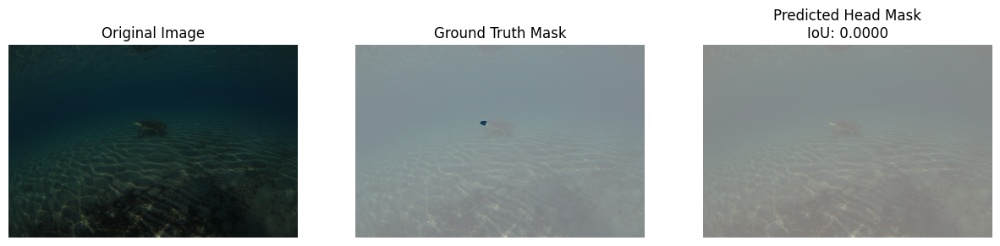

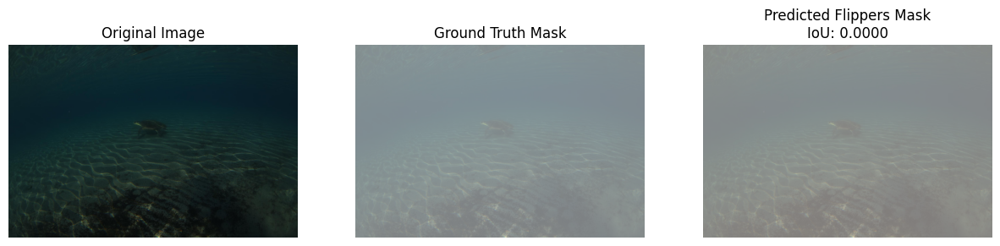

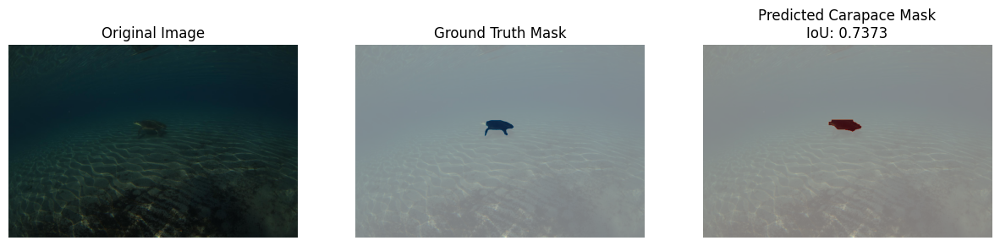

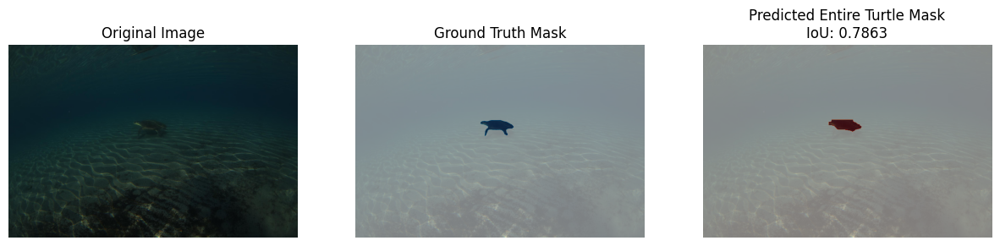

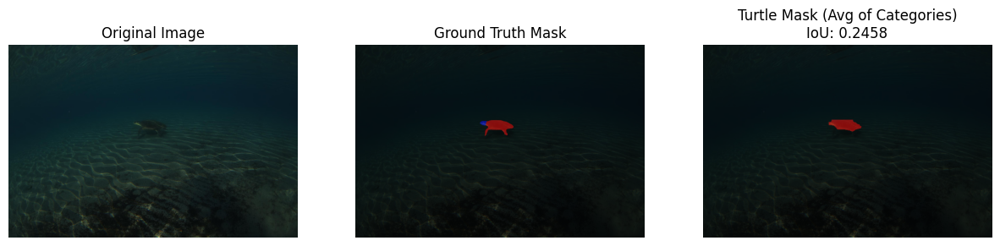

1 / 4:
Head IOU = 0.0, Flipper IOU = 0, Carapace IOU = 0.7373483597731677, Total Turtle IOU = 0.786263892846965, Avg IoU of 3 Categories = 0.2457827865910559
6752

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/aXYVhWAxfN.JPG: 448x640 1 turtle, 3 flippers, 1 head, 16.6ms
Speed: 4.7ms preprocess, 16.6ms inference, 2.8ms postprocess per image at shape (1, 3, 448, 640)


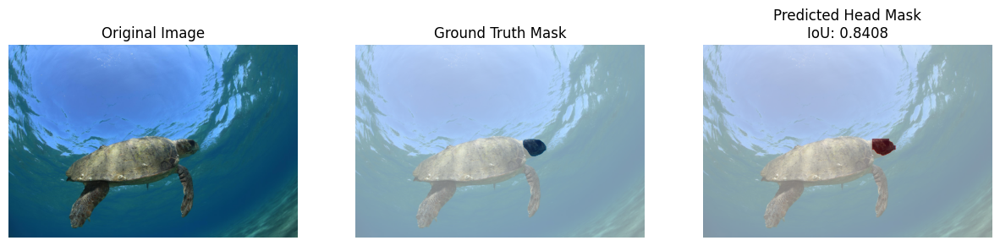

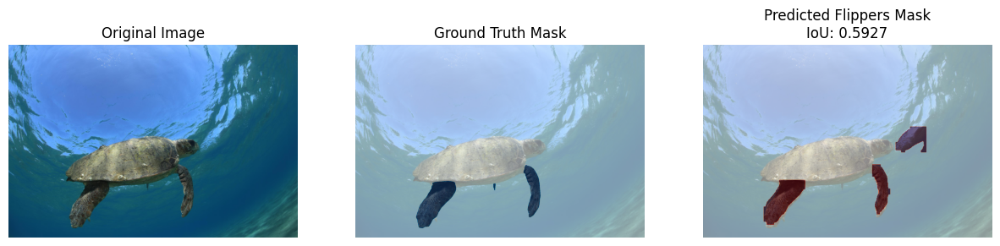

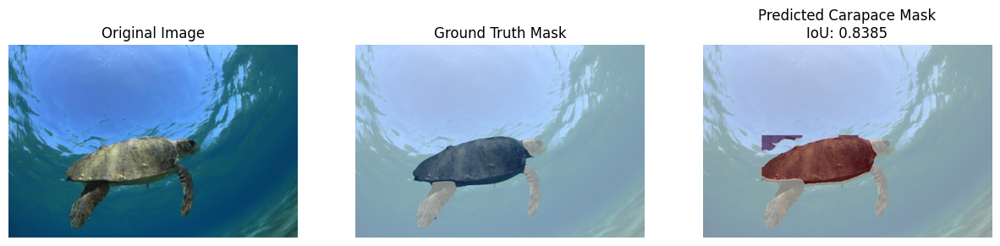

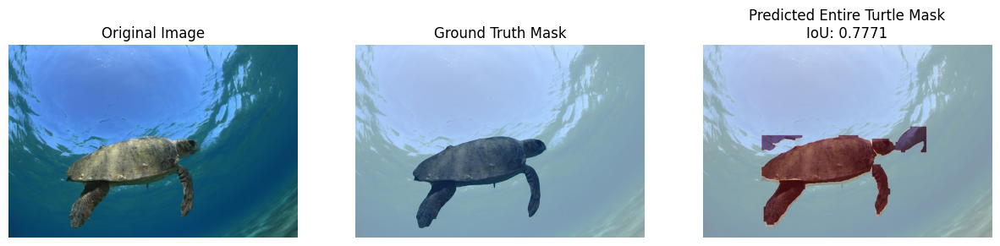

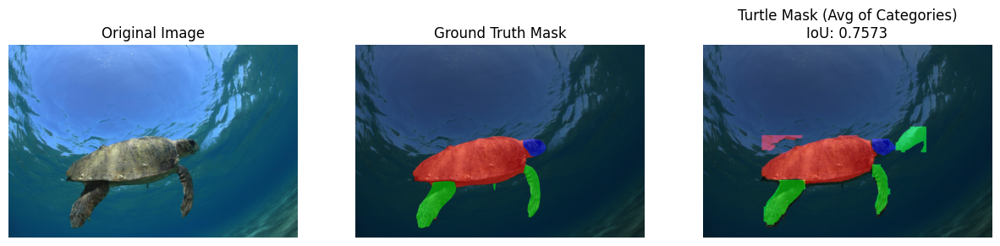

2 / 4:
Head IOU = 0.8407713143299368, Flipper IOU = 0.5926693433493071, Carapace IOU = 0.8385274621649856, Total Turtle IOU = 0.7770950735147462, Avg IoU of 3 Categories = 0.7573227066147433
7694

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/AwpdRvTioo.jpeg: 448x640 2 turtles, 4 flippers, 1 head, 16.6ms
Speed: 3.9ms preprocess, 16.6ms inference, 2.5ms postprocess per image at shape (1, 3, 448, 640)


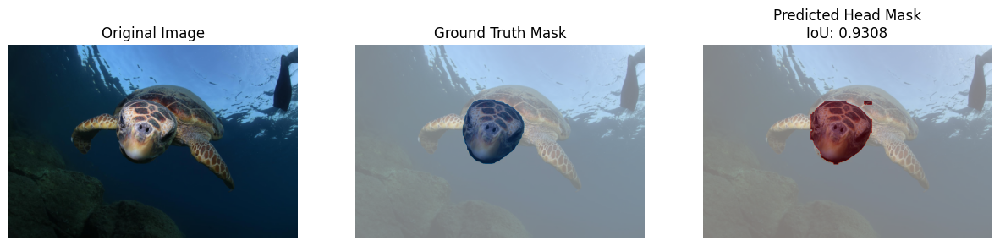

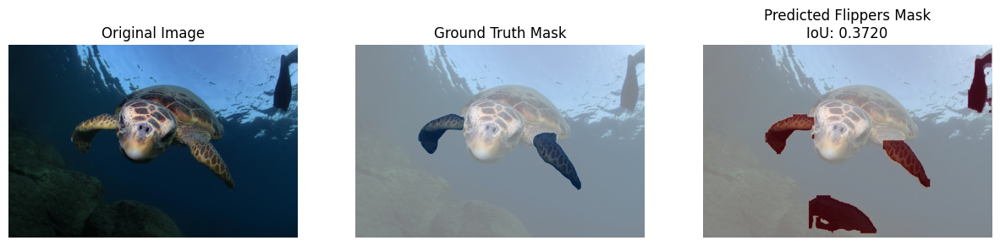

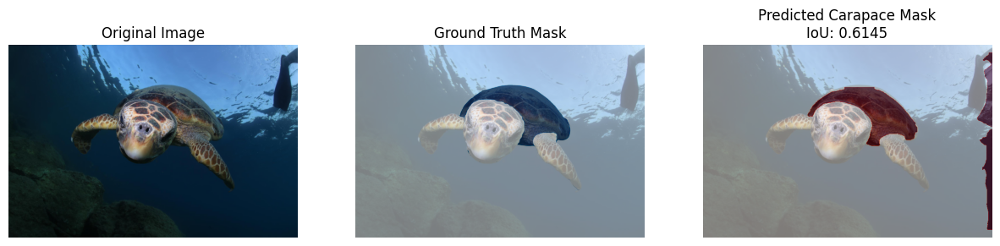

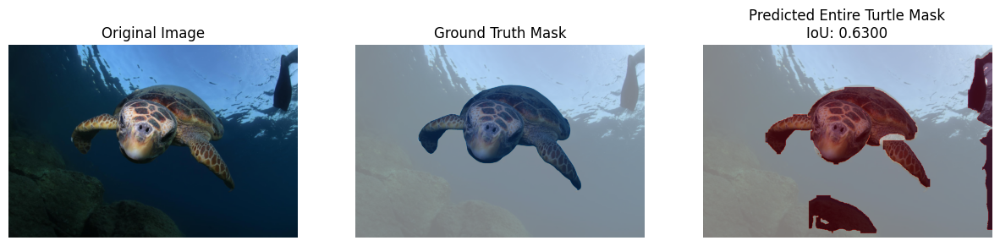

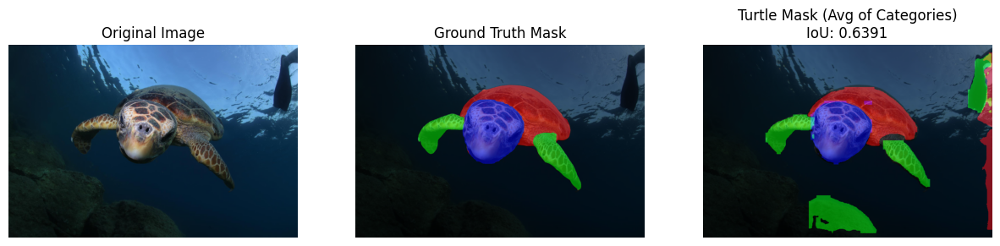

3 / 4:
Head IOU = 0.9308161303549942, Flipper IOU = 0.37197240387424435, Carapace IOU = 0.6144915196333496, Total Turtle IOU = 0.6299985818972741, Avg IoU of 3 Categories = 0.6390933512875294
8364

image 1/1 /content/drive/MyDrive/turtles/turtles-data/12_11/yolo_time_aware_split/test/images/bBsBktlTrM.jpeg: 448x640 1 turtle, 16.6ms
Speed: 3.9ms preprocess, 16.6ms inference, 2.6ms postprocess per image at shape (1, 3, 448, 640)


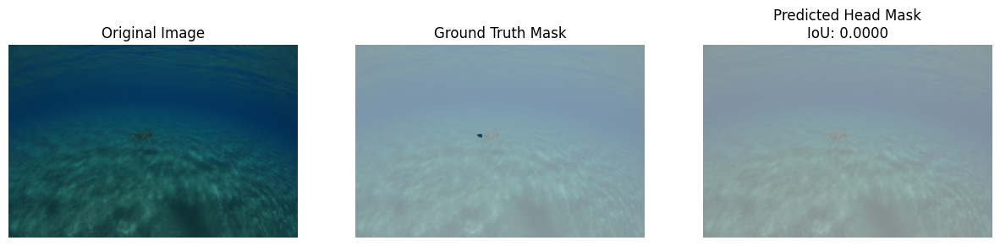

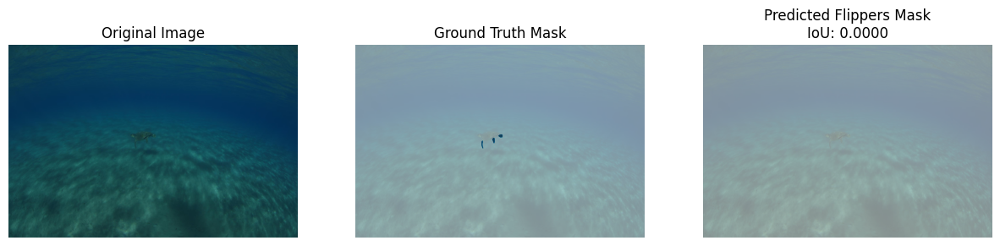

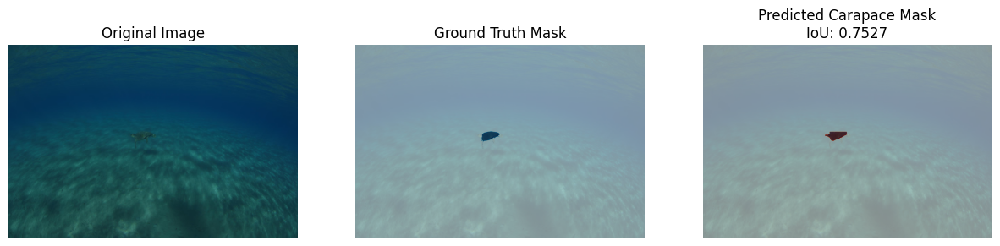

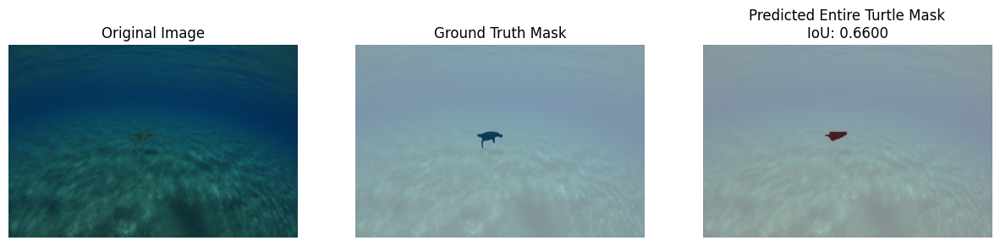

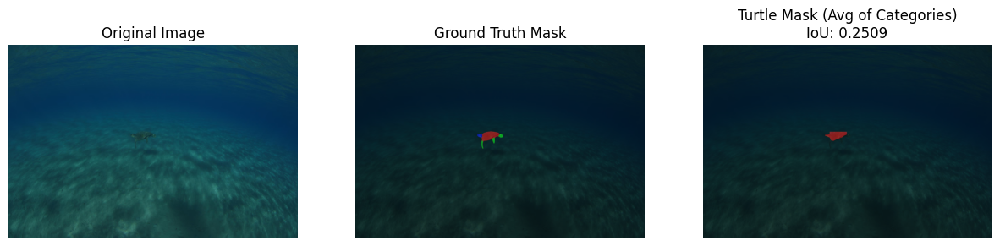

4 / 4:
Head IOU = 0.0, Flipper IOU = 0.0, Carapace IOU = 0.7527267294187957, Total Turtle IOU = 0.6600072210855699, Avg IoU of 3 Categories = 0.25090890980626523


In [ ]:
# Display Failed Segmentation Result

# Define the model and paths
test_dir = base_dir + '12_11/yolo_time_aware_split/test/images'
saved_model_path = base_dir +  '12_11/yolo_model_12_11.pt'
model = YOLO(saved_model_path)


# Define list of selected image IDs for which results are to be visualised
fail_test_ids = [5389,8364,6752,7694]

# Filter for selected image IDs
fail_test_df = test_df[test_df['id'].isin(fail_test_ids)]

print("Images that do not have Correct Segmentation")

head_miou, flippers_miou, carapace_miou, turtle_miou, avg_miou, iou_results = compute_and_display_category_miou(fail_test_df, model, coco)

# Create DataFrame and save to CSV
results_df = pd.DataFrame(iou_results)
results_df.to_csv(base_dir + '/bad_iou_results.csv', index=False)
